(template_notebook)=
# Bayesian Workflow with SEMs 

:::{post} Novemeber, 2025
:tags: confirmatory factor analysis, structural equation models, 
:category: advanced, reference
:author: Nathaniel Forde
:::

This is some introductory text. Consult the [style guide](https://docs.pymc.io/en/latest/contributing/jupyter_style.html).

In [2]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pt
import seaborn as sns
import pytensor
import warnings
pytensor.config.cxx = '/usr/bin/clang++'

warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
%config InlineBackend.figure_format = 'retina'  # high resolution figures
az.style.use("arviz-darkgrid")
rng = np.random.default_rng(42)

## Job Satisfaction and Bayesian Workflows

In [4]:

# | code-fold: true

# Standard deviations
stds = np.array([0.939, 1.017, 0.937, 0.562, 0.760, 0.524, 
                 0.585, 0.609, 0.731, 0.711, 1.124, 1.001])

n = len(stds)

# Lower triangular correlation values as a flat list
corr_values = [
    1.000,
    .668, 1.000,
    .635, .599, 1.000,
    .263, .261, .164, 1.000,
    .290, .315, .247, .486, 1.000,
    .207, .245, .231, .251, .449, 1.000,
   -.206, -.182, -.195, -.309, -.266, -.142, 1.000,
   -.280, -.241, -.238, -.344, -.305, -.230,  .753, 1.000,
   -.258, -.244, -.185, -.255, -.255, -.215,  .554,  .587, 1.000,
    .080,  .096,  .094, -.017,  .151,  .141, -.074, -.111,  .016, 1.000,
    .061,  .028, -.035, -.058, -.051, -.003, -.040, -.040, -.018,  .284, 1.000,
    .113,  .174,  .059,  .063,  .138,  .044, -.119, -.073, -.084,  .563,  .379, 1.000
]

# Fill correlation matrix
corr_matrix = np.zeros((n, n))
idx = 0
for i in range(n):
    for j in range(i+1):
        corr_matrix[i, j] = corr_values[idx]
        corr_matrix[j, i] = corr_values[idx]
        idx += 1

# Covariance matrix: Sigma = D * R * D
cov_matrix = np.outer(stds, stds) * corr_matrix
#cov_matrix_test = np.dot(np.dot(np.diag(stds), corr_matrix), np.diag(stds))
FEATURE_COLUMNS=["JW1","JW2","JW3", "UF1","UF2","FOR", "DA1","DA2","DA3", "EBA","ST","MI"]
corr_df = pd.DataFrame(corr_matrix, columns=FEATURE_COLUMNS)

cov_df = pd.DataFrame(cov_matrix, columns=FEATURE_COLUMNS)

def make_sample(cov_matrix, size, columns, missing_frac=0.0, impute=False):
    sample_df = pd.DataFrame(np.random.multivariate_normal([0]*12, cov_matrix, size=size), columns=FEATURE_COLUMNS)
    if missing_frac > 0.0: 
        total_values = sample_df.size
        num_nans = int(total_values * missing_frac)

        # Choose random flat indices
        nan_indices = np.random.choice(total_values, num_nans, replace=False)

        # Convert flat indices to (row, col)
        rows, cols = np.unravel_index(nan_indices, sample_df.shape)

        # Set the values to NaN
        sample_df.values[rows, cols] = np.nan

    if impute: 
        sample_df.fillna(sample_df.mean(axis=0), inplace=True)


    return sample_df

sample_df = make_sample(cov_matrix, 263, FEATURE_COLUMNS)
sample_df.head(10)

,JW1,JW2,JW3,UF1,UF2,FOR,DA1,DA2,DA3,EBA,ST,MI
0,1.063807,2.548472,-0.476240,0.516890,-0.177954,-0.188024,-0.662993,-1.000175,-0.789960,0.394107,0.932249,2.520359
1,-0.594383,0.957251,-0.157427,-0.243268,-0.587705,0.484294,0.455572,0.637613,0.154973,0.711884,2.442785,0.239808
2,0.120141,1.089180,-0.267775,0.160845,-0.302935,-0.699419,0.266803,0.827863,0.423772,0.368998,0.878458,1.442067
3,0.851337,1.027777,1.099457,0.310447,0.354023,0.227253,0.806504,0.374640,0.304836,-0.119545,0.042438,0.694958
4,0.856150,-1.012100,0.449046,-0.359783,0.673129,-0.212029,0.097594,0.279365,0.867013,1.541304,1.263430,0.731089
5,0.098897,0.226895,-0.248866,0.080634,0.369548,0.996627,-0.456630,-0.555841,0.935103,0.880859,0.099359,1.797949
6,0.203129,0.279619,0.665673,-0.858685,-0.456500,-0.210124,-0.066525,0.612134,-0.049333,0.968301,0.190542,-0.935978
7,-1.041024,0.169789,-0.028481,-0.524262,0.904075,0.288623,-0.778461,-0.145131,0.571710,1.166362,0.744776,0.973613
8,1.672222,1.341137,0.099733,0.390502,-0.258200,0.520296,-0.070957,-1.071956,-0.485050,0.120221,0.434765,-0.392906
9,-0.857705,-0.774514,-0.897351,-0.078049,-0.834282,-0.281671,1.284613,1.899398,1.877640,0.394814,-0.994132,2.398954


In [5]:
def header_style():
    return [
        "color: red; font-weight: bold;",
        "color: blue; font-weight: bold;",
        "color: green; font-weight: bold;"
    ]


sample_df.head().style.set_properties(**{'background-color': 'skyblue'}, subset=['JW1',	'JW2',	'JW3']).set_properties(**{'background-color': 'moccasin'}, subset=['DA1',	'DA2',	'DA3']).set_properties(**{'background-color': 'lightcoral'}, subset=['EBA',	'ST',	'MI'])


,JW1,JW2,JW3,UF1,UF2,FOR,DA1,DA2,DA3,EBA,ST,MI
0,1.063807,2.548472,-0.476240,0.516890,-0.177954,-0.188024,-0.662993,-1.000175,-0.789960,0.394107,0.932249,2.520359
1,-0.594383,0.957251,-0.157427,-0.243268,-0.587705,0.484294,0.455572,0.637613,0.154973,0.711884,2.442785,0.239808
2,0.120141,1.089180,-0.267775,0.160845,-0.302935,-0.699419,0.266803,0.827863,0.423772,0.368998,0.878458,1.442067
3,0.851337,1.027777,1.099457,0.310447,0.354023,0.227253,0.806504,0.374640,0.304836,-0.119545,0.042438,0.694958
4,0.856150,-1.012100,0.449046,-0.359783,0.673129,-0.212029,0.097594,0.279365,0.867013,1.541304,1.263430,0.731089


## Mathematical Interlude

Structural Equation Model (SEM): General Setup

We have observed variables $y \in R^{p}$, here (p=12) and $\eta \in R^{m} latent factors where m=4 and the SEM consists of two parts:

$$ y_i = \Lambda \eta_i + \varepsilon_i, 
\quad \varepsilon_i \sim \mathcal N(0, \Psi).
$$

Measurement model

Structural 

$$
\eta_i = B \eta_i + \zeta_i, 
\quad \zeta_i \sim \mathcal N(0, \Psi_{\zeta}).
$$


$$
\eta_i = (I - B)^{-1} \zeta_i.
$$

### Conditional Formulation

$$
\zeta_i \sim \mathcal N(0, \Psi_{\zeta}).

\\

\eta_i = (I-B)^{-1} \zeta_i.

\\

\mu_i = \Lambda \eta_i.

\\

y_i \mid \eta_i \sim \mathcal MvN(\mu_i, \Psi).

$$

so that 

$$ p(y_i, \zeta_i) = 
\mathcal N\!\left(\zeta_i; 0, \Psi_{\zeta}\right) \cdot
\mathcal N\!\left(y_i;\; \Lambda (I-B)^{-1}\zeta_i, \; \Psi\right).
$$

## Confirmatory Factor Analysis

In [6]:
coords = {
    "obs": list(range(len(sample_df))),
    "indicators": FEATURE_COLUMNS,
    "indicators_1": ["JW1", "JW2",  "JW3"], # job satisfaction
    "indicators_2": ["UF1", "UF2", "FOR"], # well being
    "indicators_3": ["DA1", "DA2", "DA3"], # dysfunction
    "indicators_4": ["EBA", "ST", "MI"], # constructive thought strategies
    "latent": ["satisfaction", "well being", "dysfunctional", "constructive"],
    "latent1": ["satisfaction", "well being", "dysfunctional", "constructive"],
    "paths": ["dysfunctional ~ constructive", "well being ~ dysfunctional", "well being ~ constructive", "satisfaction ~ well being", "satisfaction ~ dysfunction" ,  "satisfaction ~ constructive"], 
    "sd_params": [i + '_sd' for i in FEATURE_COLUMNS],
    "corr_params": ['UF1 ~~ FOR']
}

def make_lambda(indicators, name='lambdas1', priors=[1, 10]):
    """ Takes an argument indicators which is a string in the coords dict"""
    temp_name = name + '_'
    lambdas_ = pm.Normal(temp_name, priors[0], priors[1], dims=(indicators))
    # Force a fixed scale on the factor loadings for factor 1
    lambdas_1 = pm.Deterministic(
        name, pt.set_subtensor(lambdas_[0], 1), dims=(indicators)
    )
    return lambdas_1

def make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4):
    Lambda = pt.zeros((12, 4))
    Lambda = pt.set_subtensor(Lambda[0:3, 0], lambdas_1)
    Lambda = pt.set_subtensor(Lambda[3:6, 1], lambdas_2)
    Lambda = pt.set_subtensor(Lambda[6:9, 2], lambdas_3)
    Lambda = pt.set_subtensor(Lambda[9:12, 3], lambdas_4)
    Lambda = pm.Deterministic('Lambda', Lambda)
    return Lambda 

def make_B(priors=[0, .5], group_suffix=''):
    coefs = pm.Normal(f'mu_betas{group_suffix}', [0, 0, 0, 0, 0, 0], [1, 1, 1, 1, 1, 1], dims='paths')

    zeros = pt.zeros((4, 4))
    ## dysfunctional ~ constructive
    zeros = pt.set_subtensor(zeros[3, 2], coefs[0])
    ## well being ~ dysfunctional
    zeros = pt.set_subtensor(zeros[2, 1], coefs[1])
    ## well being ~ constructive
    zeros = pt.set_subtensor(zeros[3, 1], coefs[2])
    ## satisfaction ~ well being
    zeros = pt.set_subtensor(zeros[1, 0], coefs[3])
    ## satisfaction ~ dysfunction
    zeros = pt.set_subtensor(zeros[2, 0], coefs[4])
    ## satisfaction ~ constructive
    coefs_ = pt.set_subtensor(zeros[3, 0], coefs[5])
    return coefs_

def make_Psi(indicators, name='Psi_cov'):
    """ Takes an argument indicators which is a string in the coords dict"""
    temp_name = name + '_'
    n = len(coords[indicators])
    cov_params = pm.InverseGamma(temp_name, 3, 4, dims='sd_params')
    r = pt.zeros((n, n))
    beta_params = pm.Beta(temp_name + 'beta', 1, 1, dims='corr_params')
    for i in range(len(coords[indicators])):
        r = pt.set_subtensor(r[i, i], 1)
    # UF1 ~~ FOR
    r = pt.set_subtensor(r[3, 5], beta_params[0])
    s = pt.diag(cov_params)
    cov = (s @ r) @ pt.transpose(s @ r)
    r = pm.Deterministic('Psi_corr', r)
    cov = pm.Deterministic('Psi_cov', cov)

    return cov

def make_ppc(
    idata,
    df,
    samples=100,
    drivers=FEATURE_COLUMNS,
    dims=(2, 3),
):
    fig, axs = plt.subplots(dims[0], dims[1], figsize=(20, 10))
    axs = axs.flatten()
    for i in range(len(drivers)):
        for j in range(samples):
            temp = az.extract(idata["posterior_predictive"].sel({"likelihood_dim_3": i}))[
                "likelihood"
            ].values[:, j]
            temp = pd.DataFrame(temp, columns=["likelihood"])
            if j == 0:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20, label="Observed Scores")
                axs[i].hist(
                    temp["likelihood"], color="purple", alpha=0.1, bins=20, label="Predicted Scores"
                )
            else:
                axs[i].hist(df[drivers[i]], alpha=0.3, ec="black", bins=20)
                axs[i].hist(temp["likelihood"], color="purple", alpha=0.1, bins=20)
            axs[i].set_title(f"Posterior Predictive Checks {drivers[i]}")
            axs[i].legend()
    plt.tight_layout()
    plt.show()

def get_posterior_resids(idata, samples=100, metric="cov"):
    resids = []
    for i in range(samples):
        if metric == "cov":
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).cov()
            obs_cov = sample_df[FEATURE_COLUMNS].cov()
        else:
            model_cov = pd.DataFrame(
                az.extract(idata["posterior_predictive"])["likelihood"][:, :, i]
            ).corr()
            obs_cov = sample_df[FEATURE_COLUMNS].corr()
        model_cov.index = obs_cov.index
        model_cov.columns = obs_cov.columns
        residuals = model_cov - obs_cov
        resids.append(residuals.values.flatten())

    residuals_posterior = pd.DataFrame(pd.DataFrame(resids).mean().values.reshape(12, 12))
    residuals_posterior.index = obs_cov.index
    residuals_posterior.columns = obs_cov.index
    return residuals_posterior

obs_idx = list(range(len(sample_df)))
observed_data = sample_df[coords['indicators']].values

In [ ]:
sampler_kwargs = {'draws': 1000, 'tune': 2000}

def sample_model(model, sampler_kwargs):
    with model: 
        idata = pm.sample_prior_predictive()
        idata.extend(pm.sample(**sampler_kwargs, idata_kwargs={"log_likelihood": True}))
        idata.extend(pm.sample_posterior_predictive(idata))
    return idata


## CFA v1

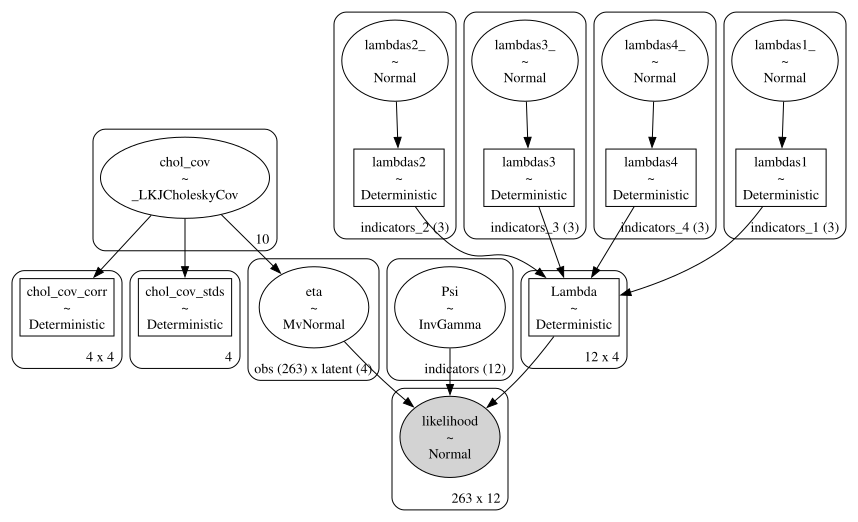

In [45]:

with pm.Model(coords=coords) as cfa_model_v1:
    
    # --- Factor loadings ---
    lambdas_1 = make_lambda('indicators_1', 'lambdas1', priors=[1, .5])
    lambdas_2 = make_lambda('indicators_2', 'lambdas2', priors=[1, .5])
    lambdas_3 = make_lambda('indicators_3', 'lambdas3', priors=[1, .5])
    lambdas_4 = make_lambda('indicators_4', 'lambdas4', priors=[1, .5])

    Lambda = pt.zeros((12, 4))
    Lambda = pt.set_subtensor(Lambda[0:3, 0], lambdas_1)
    Lambda = pt.set_subtensor(Lambda[3:6, 1], lambdas_2)
    Lambda = pt.set_subtensor(Lambda[6:9, 2], lambdas_3)
    Lambda = pt.set_subtensor(Lambda[9:12, 3], lambdas_4)
    Lambda = pm.Deterministic('Lambda', Lambda)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)
    eta = pm.MvNormal("eta", 0, chol=chol, dims=("obs", "latent"))

    # Construct Pseudo Observation matrix based on Factor Loadings
    mu = pt.dot(eta, Lambda.T)  # (n_obs, n_indicators)

    ## Error Terms
    Psi = pm.InverseGamma("Psi", 5, 10, dims="indicators")
    _ = pm.Normal('likelihood', mu=mu, sigma=Psi, observed=observed_data)

pm.model_to_graphviz(cfa_model_v1)

In [46]:
idata_cfa_model_v1 = sample_model(cfa_model_v1, sampler_kwargs=sampler_kwargs)

Sampling: [Psi, chol_cov, eta, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, eta, Psi]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

In [71]:
parameters = ['lambdas1_', 'lambdas2_', 'lambdas3_', 'lambdas4_']
def plot_diagnostics(idata, parameters):
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs = axs.flatten()
    az.plot_energy(idata, ax=axs[0])
    az.summary(idata, var_names=parameters)['r_hat'].plot(kind='barh', alpha=0.5, ax=axs[1])
    axs[1].axvline(1, color='black')
    axs[0].set_title("Energy Plot \n Overlapping Distributions is Good")
    axs[1].set_title("Rhat Plot \n Values <= 1.01 is Good")
    return fig




In [72]:

def plot_model_highlights(idata, model_name, parameters, sem=False):
    mosaic = """ABCD
                EEEE
                EEEE
                FFFF"""
    axs = plt.subplot_mosaic(mosaic, figsize=(30, 20))
    axs = axs[1]
    latents = ["satisfaction", "well being", "dysfunctional", "constructive"]

    az.plot_forest(idata, var_names=['eta'], coords={'latent': ['satisfaction']}, combined=True, ax=axs['A'], ridgeplot_alpha=.5, colors='deepskyblue')
    az.plot_forest(idata, var_names=['eta'], coords={'latent': ['well being']}, combined=True, ax=axs['B'], colors='gold', ridgeplot_alpha=.5)
    az.plot_forest(idata, var_names=['eta'], coords={'latent': ['constructive']}, combined=True, ax=axs['C'], colors='lightcoral', ridgeplot_alpha=.5)
    az.plot_forest(idata, var_names=['eta'], coords={'latent': ['dysfunctional']}, combined=True, ax=axs['D'], colors='slateblue', ridgeplot_alpha=.5)
    axs['A'].set_title("Satisfaction")
    axs['B'].set_title("Well Being")
    axs['C'].set_title("Constructive")
    axs['D'].set_title("Dysfunctional")
    axs['A'].axvline(0, color='k')
    axs['B'].axvline(0, color='k')
    axs['C'].axvline(0, color='k')
    axs['D'].axvline(0, color='k')
    axs['A'].set_yticklabels([]);
    axs['B'].set_yticklabels([]);
    axs['C'].set_yticklabels([]);
    axs['D'].set_yticklabels([]);
    az.plot_forest(idata, var_names=parameters, combined=True, ax=axs['E']);
    axs['E'].set_title(f"Parameter Estimates for {model_name}")
    axs['E'].axvline(1, color='k', linestyle='--');
    if sem:
        axs['E'].axvline(0, color='k')

    residuals_posterior_corr = get_posterior_resids(idata, 2500, metric="corr")
    mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
    sns.heatmap(residuals_posterior_corr, annot=True, cmap="bwr", mask=mask, ax=axs['F'], vmin=-1, vmax=1, cbar=False)
    axs['F'].set_title(f"Residuals for {model_name}");
    plt.suptitle("Latent Scores, Parameters Estimates \n and Performance Measures", fontsize=20);
    fig = plt.gcf()
    return fig



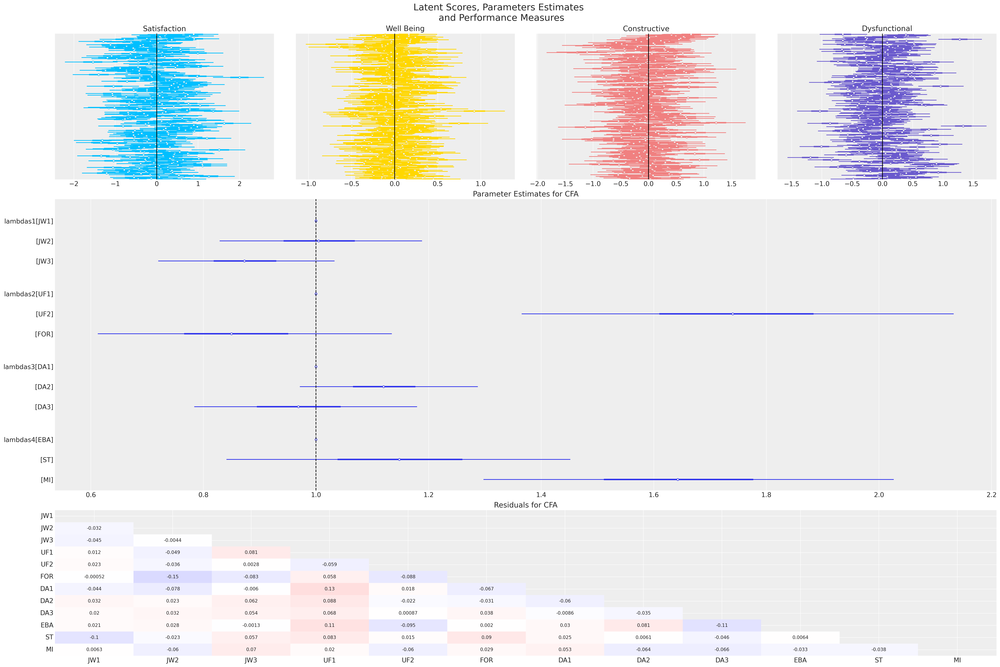

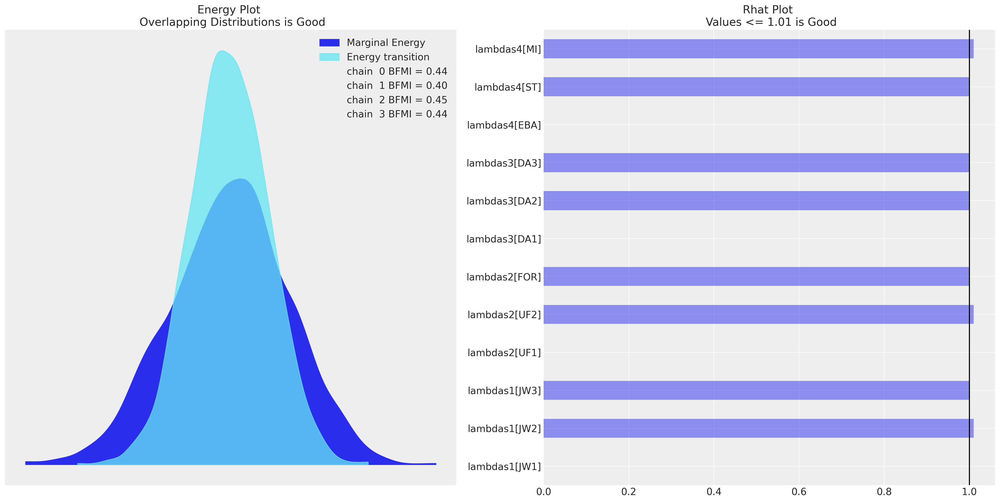

In [73]:
model_name = 'CFA'
parameters = ['lambdas1', 'lambdas2', 'lambdas3', 'lambdas4']

plot_model_highlights(idata_cfa_model_v1, 'CFA',parameters);
plot_diagnostics(idata_cfa_model_v1, parameters);

## SEM V1 Conditional Formulation

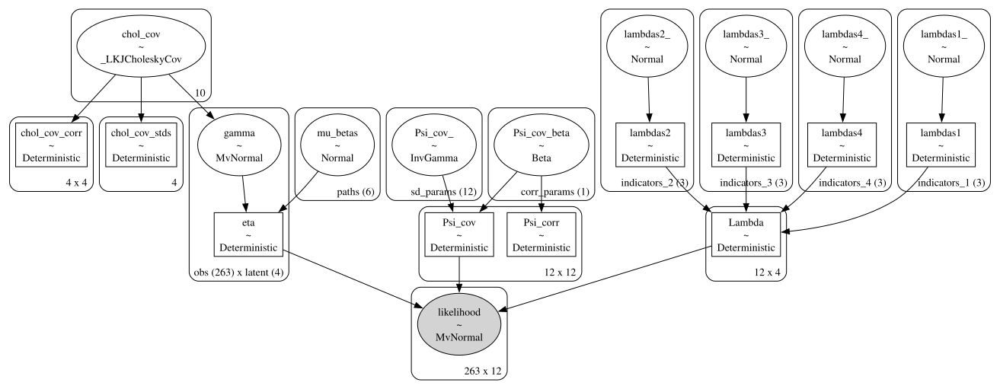

In [75]:
with pm.Model(coords=coords) as sem_model_v1:
    
    # --- Factor loadings ---
    lambdas_1 = make_lambda('indicators_1', 'lambdas1', priors=[1, .5])
    lambdas_2 = make_lambda('indicators_2', 'lambdas2', priors=[1, .5])
    lambdas_3 = make_lambda('indicators_3', 'lambdas3', priors=[1, .5])
    lambdas_4 = make_lambda('indicators_4', 'lambdas4', priors=[1, .5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    latent_dim = len(coords['latent'])

    sd_dist = pm.Exponential.dist(1.0, shape=latent_dim)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=latent_dim, eta=2, sd_dist=sd_dist, compute_corr=True)
    gamma = pm.MvNormal("gamma", 0, chol=chol, dims=("obs", "latent"))

    B = make_B()
    I = pt.eye(latent_dim)
    eta = pm.Deterministic("eta", pt.slinalg.solve(I - B + 1e-8 * I, gamma.T).T, dims=("obs", "latent"))  

    mu = pt.dot(eta, Lambda.T)

    ## Error Terms
    Psi = make_Psi('indicators')
    _ = pm.MvNormal('likelihood', mu=mu, cov=Psi, observed=observed_data)

pm.model_to_graphviz(sem_model_v1)

In [76]:
idata_sem_model_v1 = sample_model(sem_model_v1, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, gamma, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, gamma, mu_betas, Psi_cov_, Psi_cov_beta]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 96 seconds.
There were 223 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

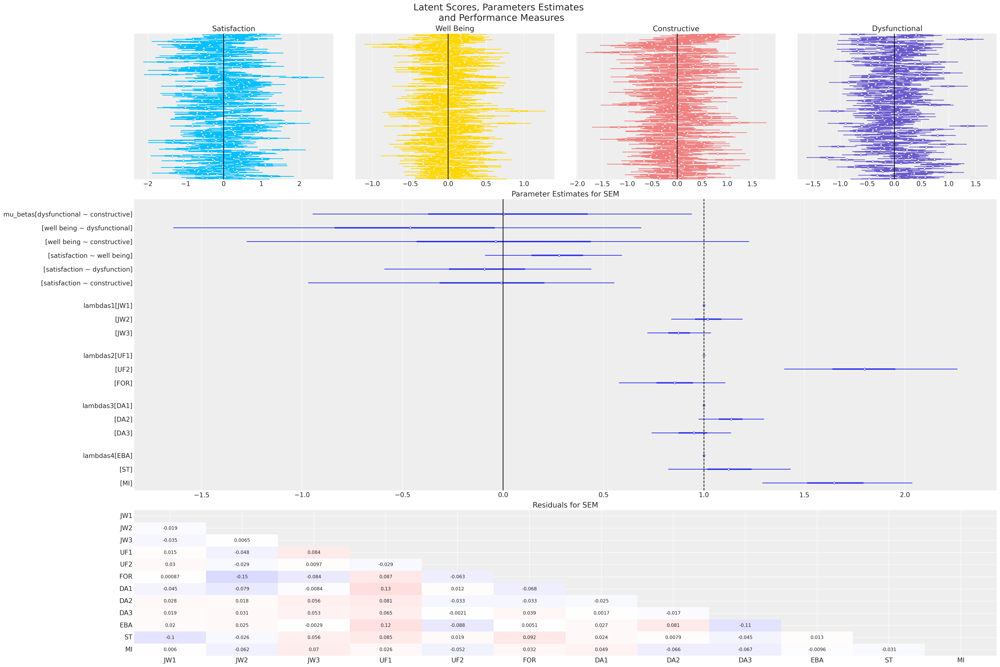

In [77]:
parameters=['mu_betas', 'lambdas1', 'lambdas2', 'lambdas3', 'lambdas4']
plot_model_highlights(idata_sem_model_v1, 'SEM',parameters, sem=True);


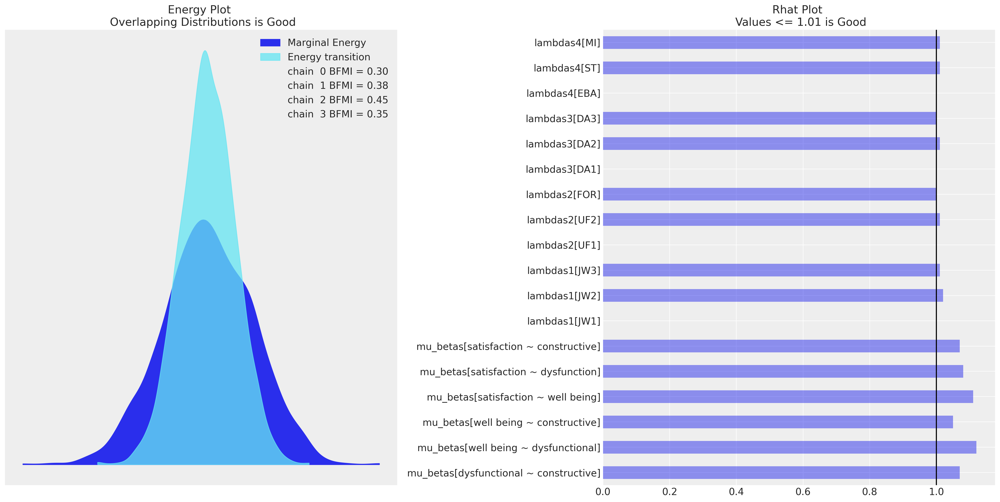

In [79]:
plot_diagnostics(idata_sem_model_v1, parameters);

## SEM V2 Marginal Formulation

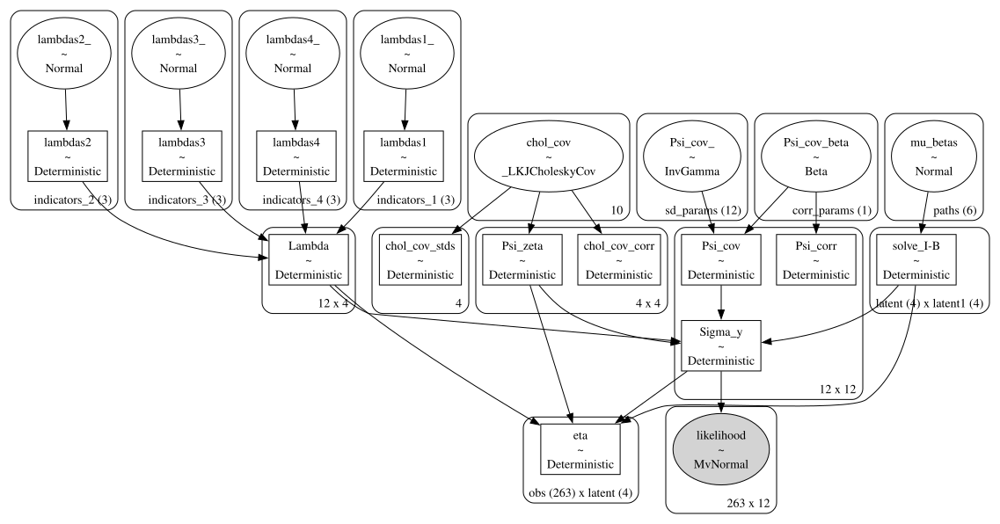

In [81]:
with pm.Model(coords=coords) as sem_model_v2:
    
    # --- Factor loadings ---
    lambdas_1 = make_lambda('indicators_1', 'lambdas1', priors=[1, .5])
    lambdas_2 = make_lambda('indicators_2', 'lambdas2', priors=[1, .5])
    lambdas_3 = make_lambda('indicators_3', 'lambdas3', priors=[1, .5])
    lambdas_4 = make_lambda('indicators_4', 'lambdas4', priors=[1, .5])

    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

    Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
    Psi = make_Psi('indicators')

    B = make_B()
    latent_dim = len(coords['latent'])
    I = pt.eye(latent_dim)
    lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
    inv_lhs = pm.Deterministic('solve_I-B', pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=('latent', 'latent1'))

    Sigma_y = pm.Deterministic('Sigma_y', Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi)
    ## Eta is inferred not sampled!
    M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
    eta_hat = pm.Deterministic('eta', (M @ (observed_data - 0).T).T, dims=('obs', 'latent')) 
    _ = pm.MvNormal("likelihood", mu=0, cov=Sigma_y, observed=observed_data)

pm.model_to_graphviz(sem_model_v2)

In [82]:
idata_sem_model_v2 = sample_model(sem_model_v2, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, mu_betas]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 58 seconds.
There were 6 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: [likelihood]


Output()

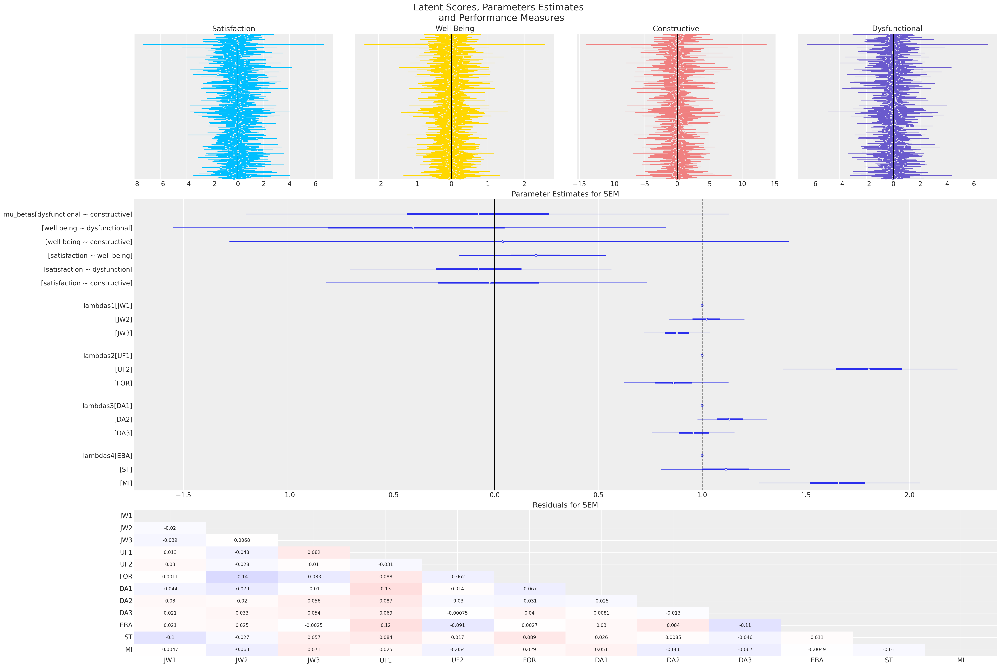

In [83]:
parameters=['mu_betas', 'lambdas1', 'lambdas2', 'lambdas3', 'lambdas4']
plot_model_highlights(idata_sem_model_v2, 'SEM',parameters, sem=True);

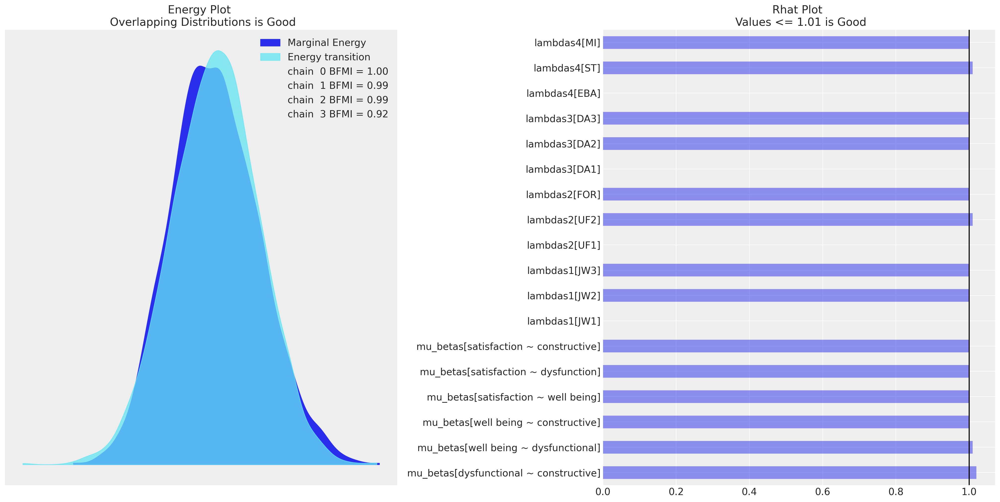

In [84]:
plot_diagnostics(idata_sem_model_v2, parameters);

## Mean Structure SEM

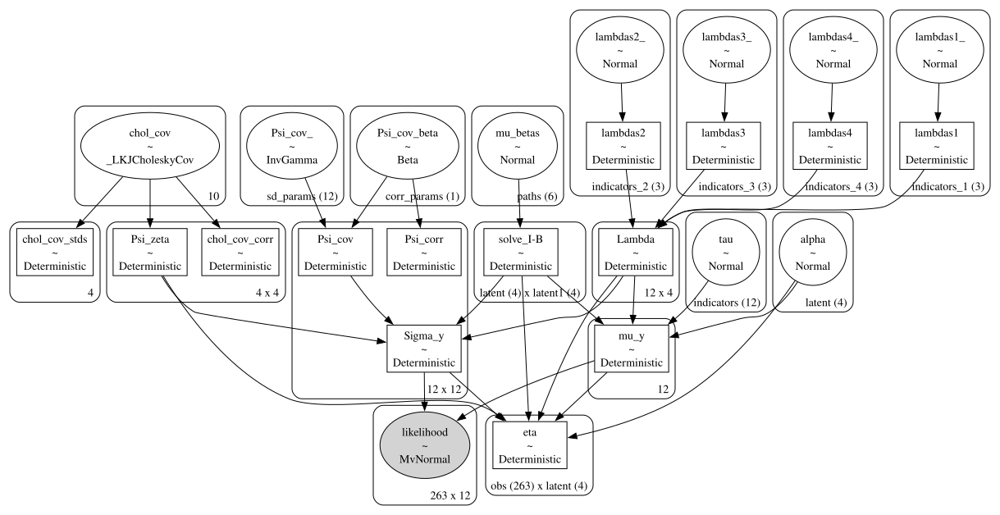

In [85]:
with pm.Model(coords=coords) as sem_model_mean_structure:
    
    # --- Factor loadings ---
    lambdas_1 = make_lambda('indicators_1', 'lambdas1', priors=[1, .5])
    lambdas_2 = make_lambda('indicators_2', 'lambdas2', priors=[1, .5])
    lambdas_3 = make_lambda('indicators_3', 'lambdas3', priors=[1, .5])
    lambdas_4 = make_lambda('indicators_4', 'lambdas4', priors=[1, .5])
    Lambda = make_Lambda(lambdas_1, lambdas_2, lambdas_3, lambdas_4)

    sd_dist = pm.Exponential.dist(1.0, shape=4)
    chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

    Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
    Psi = make_Psi('indicators')

    B = make_B()
    latent_dim = len(coords['latent'])
    I = pt.eye(latent_dim)
    lhs = I - B + 1e-8 * pt.eye(latent_dim)  # (latent_dim, latent_dim)
    inv_lhs = pm.Deterministic('solve_I-B', pt.slinalg.solve(lhs, pt.eye(latent_dim)), dims=('latent', 'latent1'))

    # Mean Structure
    tau = pm.Normal("tau", mu=0, sigma=0.5, dims="indicators")   # observed intercepts 
    alpha = pm.Normal("alpha", mu=0, sigma=0.5, dims="latent")       # latent means
    mu_y = pm.Deterministic("mu_y", tau + pt.dot(Lambda, pt.dot(inv_lhs, alpha)))

    Sigma_y = pm.Deterministic('Sigma_y', Lambda.dot(inv_lhs).dot(Psi_zeta).dot(inv_lhs.T).dot(Lambda.T) + Psi)
    M = Psi_zeta @ inv_lhs @ Lambda.T @ pm.math.matrix_inverse(Sigma_y)
    eta_hat = pm.Deterministic('eta', alpha + (M @ (observed_data - mu_y).T).T, dims=('obs', 'latent')) 
    _ = pm.MvNormal("likelihood", mu=mu_y, cov=Sigma_y, observed=observed_data)

pm.model_to_graphviz(sem_model_mean_structure)


In [86]:
idata_sem_model_v3 = sample_model(sem_model_mean_structure, sampler_kwargs)

Sampling: [Psi_cov_, Psi_cov_beta, alpha, chol_cov, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, mu_betas, tau]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, mu_betas, tau, alpha]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 82 seconds.
There were 8 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [likelihood]


Output()

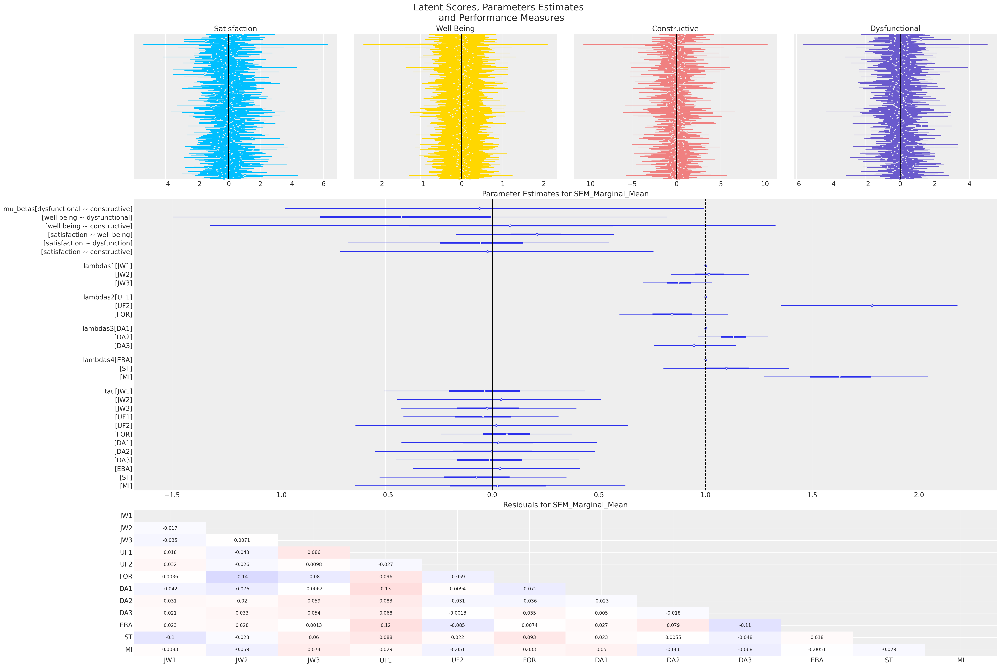

In [87]:
parameters=['mu_betas', 'lambdas1', 'lambdas2', 'lambdas3', 'lambdas4', 'tau']
plot_model_highlights(idata_sem_model_v3, 'SEM_Marginal_Mean',parameters, sem=True);

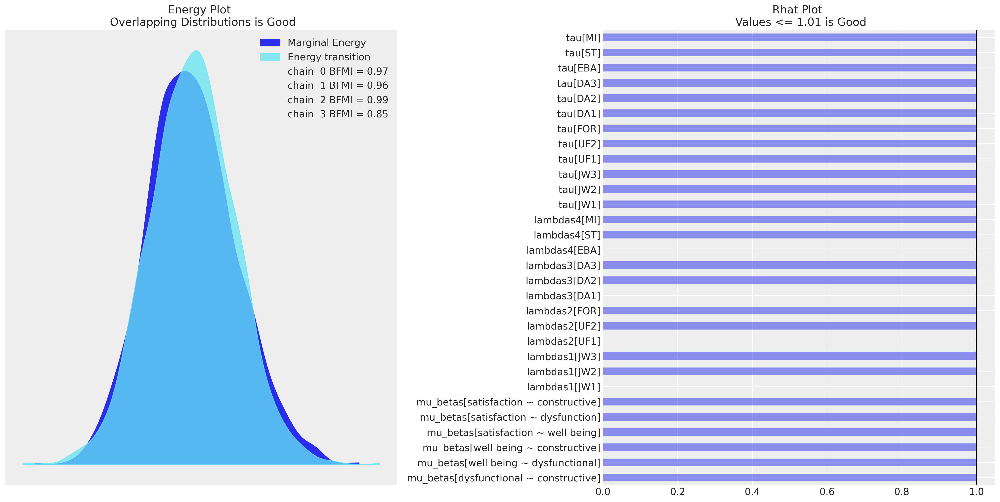

In [89]:
plot_diagnostics(idata_sem_model_v3, parameters);

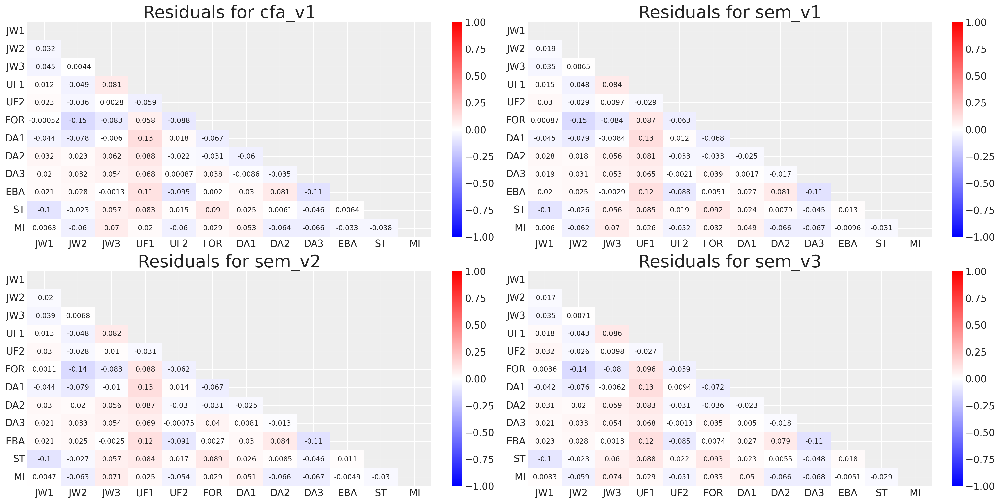

In [90]:
import seaborn as sns

idatas = [idata_cfa_model_v1, idata_sem_model_v1, 
          idata_sem_model_v2, idata_sem_model_v3]
model_names=['cfa_v1', 'sem_v1', 'sem_v2', 'sem_v3']


fig, axs = plt.subplots(2, 2, figsize=(20, 10))
axs = axs.flatten()
for idata, model_name, ax in zip(idatas, model_names, axs):
    residuals_posterior_corr = get_posterior_resids(idata, 2500, metric="corr")
    mask = np.triu(np.ones_like(residuals_posterior_corr, dtype=bool))
    sns.heatmap(residuals_posterior_corr, annot=True, cmap="bwr", mask=mask, ax=ax, vmin=-1, vmax=1)
    ax.set_title(f"Residuals for {model_name}", fontsize=25);

## Hierarchical Model on Structural Components

In [8]:
grp_idx = np.random.binomial(1, .5, 500)
coords['group'] = ['treatment', 'control']
coords.keys()

dict_keys(['obs', 'indicators', 'indicators_1', 'indicators_2', 'indicators_3', 'indicators_4', 'latent', 'latent1', 'paths', 'sd_params', 'corr_params', 'group'])

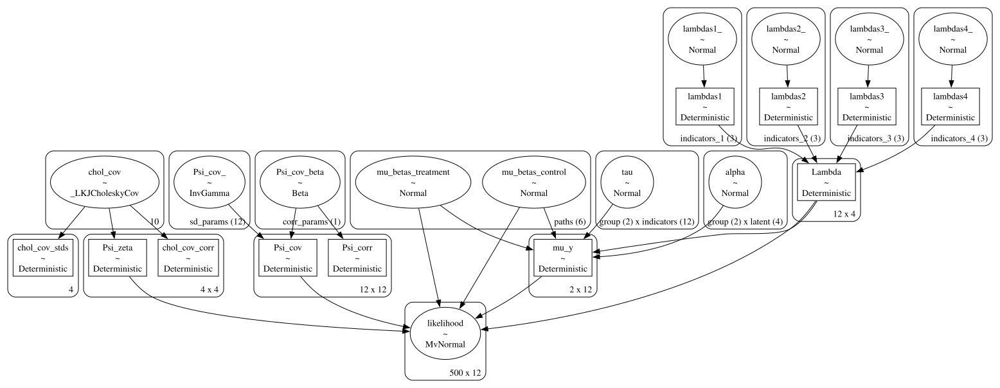

In [35]:
def make_hierarchical(priors, grp_idx):
    with pm.Model(coords=coords) as sem_model_hierarchical:

        # --- Factor loadings ---
        lambdas_1 = make_lambda('indicators_1', 'lambdas1', priors=priors['lambdas'])
        lambdas_2 = make_lambda('indicators_2', 'lambdas2', priors=priors['lambdas'])
        lambdas_3 = make_lambda('indicators_3', 'lambdas3', priors=priors['lambdas'])
        lambdas_4 = make_lambda('indicators_4', 'lambdas4', priors=priors['lambdas'])

        Lambda = pt.zeros((12, 4))
        Lambda = pt.set_subtensor(Lambda[0:3, 0], lambdas_1)
        Lambda = pt.set_subtensor(Lambda[3:6, 1], lambdas_2)
        Lambda = pt.set_subtensor(Lambda[6:9, 2], lambdas_3)
        Lambda = pt.set_subtensor(Lambda[9:12, 3], lambdas_4)
        Lambda = pm.Deterministic('Lambda', Lambda)

        sd_dist = pm.Exponential.dist(1.0, shape=4)
        chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=2, sd_dist=sd_dist, compute_corr=True)

        Psi_zeta = pm.Deterministic("Psi_zeta", chol.dot(chol.T))
        Psi = make_Psi('indicators')

        Bs = []
        for g in coords["group"]:
            B_g = make_B(group_suffix=f"_{g}", priors=priors['B'])  # give group-specific names
            Bs.append(B_g)
        B_ = pt.stack(Bs)

        latent_dim = len(coords['latent'])
        I = pt.eye(latent_dim)

        # invert (I - B_g) for each group
        inv_I_minus_B = pt.stack([
            pt.slinalg.solve(I - B_[g] + 1e-8 * I, I)
            for g in range(len(coords["group"]))
        ])

        # Mean Structure
        tau = pm.Normal("tau", mu=priors['tau'][0], sigma=priors['tau'][1], dims=('group', 'indicators'))   # observed intercepts 
        alpha = pm.Normal("alpha", mu=0, sigma=0.5, dims=('group', 'latent'))       # latent means
        M = pt.matmul(Lambda, inv_I_minus_B)  
        mu_latent = pt.matmul(alpha[:, None, :], M.transpose(0, 2, 1))[:,:,0]
        mu_y = pm.Deterministic("mu_y", tau + mu_latent)

        Sigma_y = []
        for g in range(len(coords['group'])):
            inv_lhs = inv_I_minus_B[g]
            Sigma_y_g = Lambda @ inv_lhs @ Psi_zeta @ inv_lhs.T @ Lambda.T + Psi
            Sigma_y.append(Sigma_y_g)
        Sigma_y = pt.stack(Sigma_y)
        _ = pm.MvNormal("likelihood", mu=mu_y[grp_idx], cov=Sigma_y[grp_idx])
    
    return sem_model_hierarchical 

priors = {'lambdas': [1, .5], 
          'eta': 2, 
          'B': [0, .5], 
          'tau': [0, 1]}

priors_wide = {'lambdas': [1, 5], 
          'eta': 2, 
          'B': [0, 5], 
          'tau': [0, 10]}

sem_model_hierarchical_tight = make_hierarchical(priors, grp_idx)
sem_model_hierarchical_wide = make_hierarchical(priors_wide, grp_idx)

pm.model_to_graphviz(sem_model_hierarchical_tight)

In [36]:
# Generating data from model by fixing parameters
fixed_parameters = {
 "mu_betas_treatment": [0.1, 0.5, 2.3, 0.9, 0.6, 0.8],
 "mu_betas_control": [0.3, 0.2, 0.7, 0.8, 0.6, 1.2], 
 "tau": [[-0.822,  1.917, -0.743, -0.585, -1.095,  2.207, -0.898, -0.99 ,
        1.872, -0.044, -0.035, -0.085], [-0.882,  1.816, -0.828, -1.319,
        0.202,  1.267, -1.784, -2.112,  3.705, -0.769,  2.048, -1.064]],
 "lambdas1_": [1, .8, .9],
 "lambdas2_": [1, .9, 1.2],
 "lambdas3_": [1, .95, .8],
 "lambdas4_": [1, 1.4, 1.1],
 "alpha": [[ 0.869,  0.242,  0.314, -0.175], [0.962,  1.036,  0.436,  0.166]], 
 "chol_cov": [0.696, -0.096,  0.23 , -0.3  , -0.385,  0.398, -0.004,  0.043,
       -0.037,  0.422], 
"Psi_cov_": [0.559, 0.603, 0.666, 0.483, 0.53 , 0.402, 0.35 , 0.28 , 0.498,
       0.494, 0.976, 0.742], 
"Psi_cov_beta": [0.029]
}
with pm.do(sem_model_hierarchical_tight, fixed_parameters) as synthetic_model:
   idata = pm.sample_prior_predictive(random_seed=1000) # Sample from prior predictive distribution.
   synthetic_y = idata['prior']['likelihood'].sel(draw=0, chain=0)


Sampling: [likelihood]


In [37]:
synthetic_y

<xarray.DataArray 'likelihood' (likelihood_dim_0: 500, likelihood_dim_1: 12)> Size: 48kB
array([[-0.62376935,  2.19898807,  0.74263994, ..., -0.89990557,
        -2.16098065, -0.90342905],
       [-0.97657466,  2.29131555, -0.82104217, ..., -1.01445146,
         1.74205584, -1.0223638 ],
       [ 1.15125345,  3.14374991,  0.63097201, ...,  2.61622002,
         3.50629158,  1.94752048],
       ...,
       [-0.53742613,  2.63988064, -1.09750184, ..., -1.77616602,
         3.06645224, -1.51848985],
       [ 0.34436296,  2.83679382, -0.05050973, ..., -0.79737238,
         1.87624126, -1.02833811],
       [-0.16707063,  3.40522207, -0.16393489, ..., -0.13553372,
         2.68918971, -0.70570644]])
Coordinates:
    chain             int64 8B 0
    draw              int64 8B 0
  * likelihood_dim_0  (likelihood_dim_0) int64 4kB 0 1 2 3 4 ... 496 497 498 499
  * likelihood_dim_1  (likelihood_dim_1) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11

In [38]:
# Infer parameters conditioned on observed data
with pm.observe(sem_model_hierarchical_wide, {"likelihood": synthetic_y}) as inference_model:
   idata = pm.sample(random_seed=100, nuts_sampler='numpyro', chains=4, draws=500)

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [39]:
idata

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

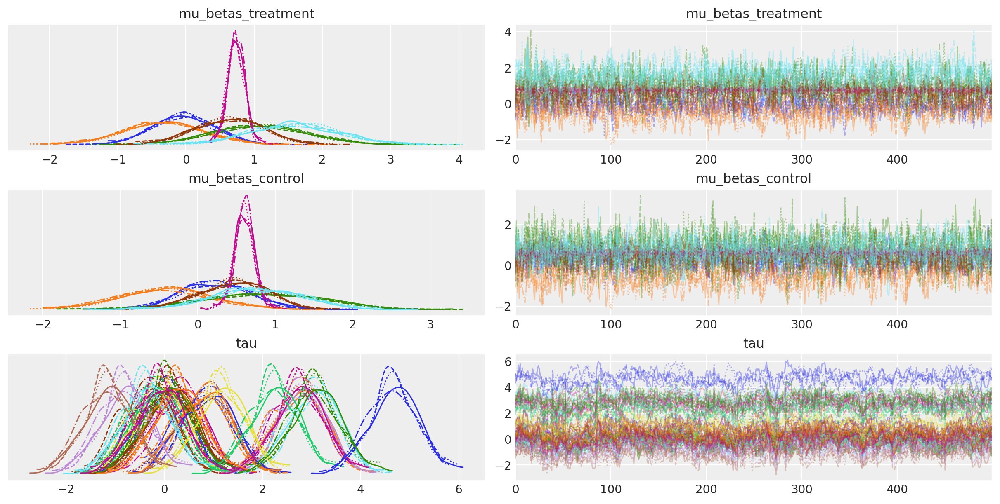

In [40]:
az.plot_trace(idata, var_names=['mu_betas_treatment', 'mu_betas_control', 'tau']);

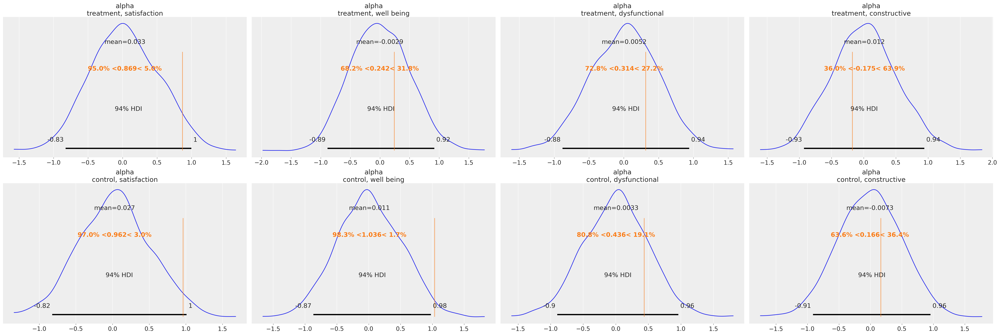

In [42]:
az.plot_posterior(idata, var_names=['alpha'], ref_val=[0.869, 0.242,  0.314, -0.175, 0.962,  1.036,  0.436,  0.166]);

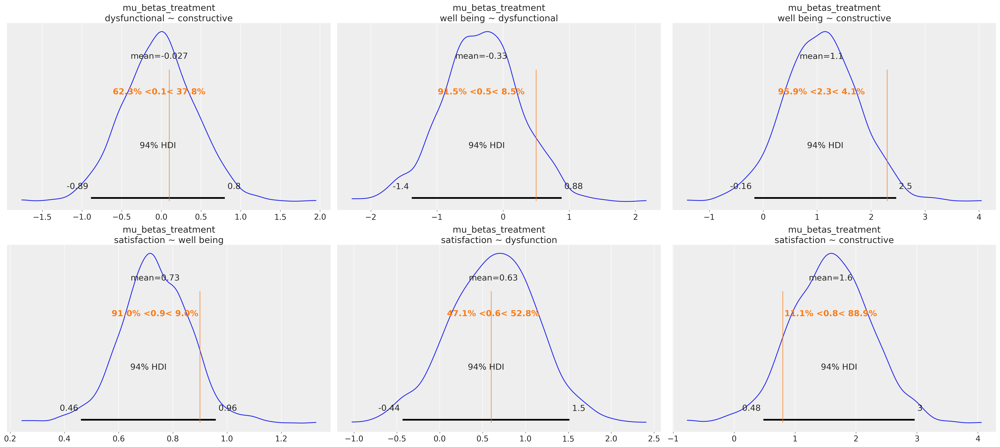

In [43]:
az.plot_posterior(idata, var_names=['mu_betas_treatment'], ref_val=[0.1, 0.5, 2.3, 0.9, 0.6, 0.8]);

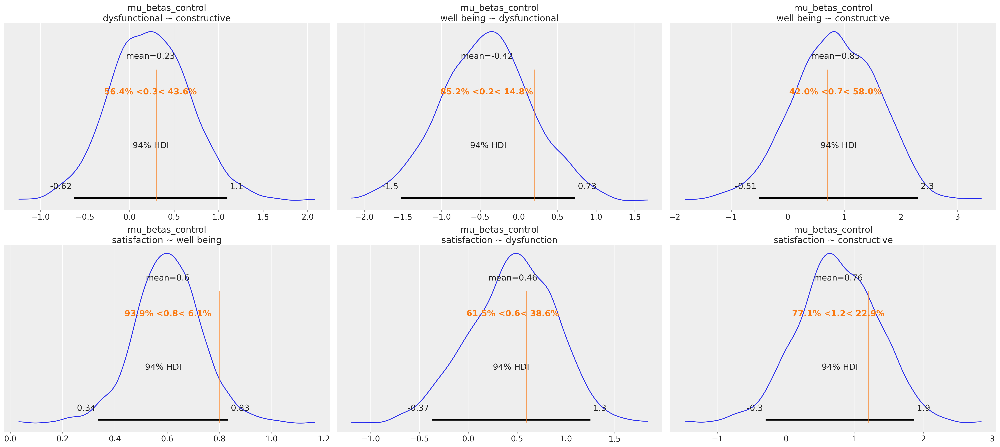

In [44]:
az.plot_posterior(idata, var_names=['mu_betas_control'], ref_val=[0.3, 0.2, 0.7, 0.8, 0.6, 1.2]);

## Add Discrete Choice Component


In [225]:
observed_data_discrete = make_sample(cov_matrix, 1000, FEATURE_COLUMNS)
observed_data_discrete = observed_data_discrete.values
coords['obs'] = range(len(observed_data_discrete))
coords['alts'] = ['stay', 'quit', 'quiet quit']

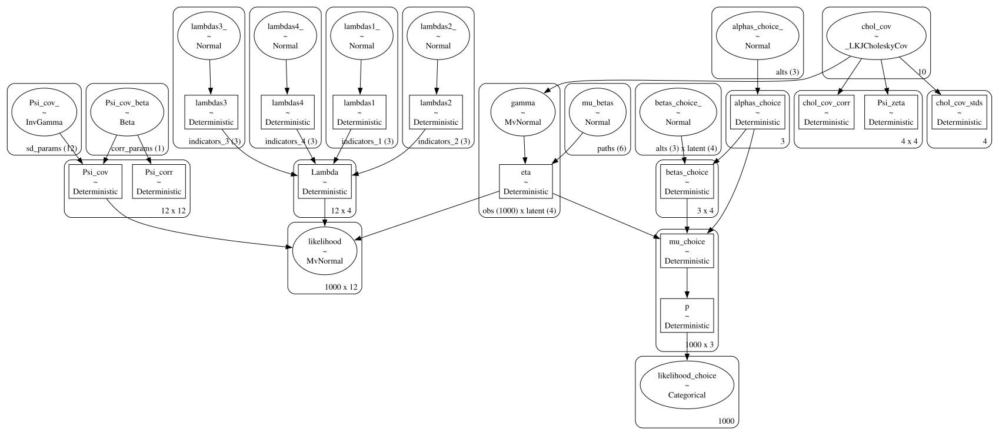

In [ ]:
def make_discrete_choice_conditional(priors):
    with pm.Model(coords=coords) as sem_model_discrete_choice:
        
        
        # --- Factor loadings ---
        lambdas_1 = make_lambda('indicators_1', 'lambdas1', priors=priors['lambdas'])
        lambdas_2 = make_lambda('indicators_2', 'lambdas2', priors=priors['lambdas'])
        lambdas_3 = make_lambda('indicators_3', 'lambdas3', priors=priors['lambdas'])
        lambdas_4 = make_lambda('indicators_4', 'lambdas4', priors=priors['lambdas'])

        Lambda = pt.zeros((12, 4))
        Lambda = pt.set_subtensor(Lambda[0:3, 0], lambdas_1)
        Lambda = pt.set_subtensor(Lambda[3:6, 1], lambdas_2)
        Lambda = pt.set_subtensor(Lambda[6:9, 2], lambdas_3)
        Lambda = pt.set_subtensor(Lambda[9:12, 3], lambdas_4)
        Lambda = pm.Deterministic('Lambda', Lambda)

        sd_dist = pm.Exponential.dist(1.0, shape=4)
        chol, _, _ = pm.LKJCholeskyCov("chol_cov", n=4, eta=priors['eta'], sd_dist=sd_dist, compute_corr=True)

        Psi = make_Psi('indicators')

        latent_dim = len(coords['latent'])
        gamma = pm.MvNormal("gamma", 0, chol=chol, dims=("obs", "latent"))

        B = make_B()
        I = pt.eye(latent_dim)
        eta = pm.Deterministic("eta", pt.slinalg.solve(I - B + 1e-8 * I, gamma.T).T, dims=("obs", "latent"))  

        mu = pt.dot(eta, Lambda.T)
          ## Error Term
        _ = pm.MvNormal('likelihood', mu=mu, cov=Psi)

        alphas_choice_ = pm.Normal('alphas_choice_', priors['alphas_choice'][0], priors['alphas_choice'][1], dims=('alts',))
        alphas_choice = pm.Deterministic('alphas_choice', pt.set_subtensor(alphas_choice_[-1], 0))
        betas_choice_ = pm.Normal('betas_choice_', priors['betas_choice'][0], priors['betas_choice'][1], dims=('alts', 'latent'))
        betas_choice = pm.Deterministic('betas_choice',  pt.expand_dims(alphas_choice, 1)*betas_choice_)
        utility_of_work = pm.Deterministic('mu_choice', alphas_choice + pm.math.dot(eta, betas_choice.T))
        p = pm.Deterministic('p', pm.math.softmax(utility_of_work, axis=1))
        _ = pm.Categorical('likelihood_choice', p)


    return sem_model_discrete_choice

priors = {'lambdas': [1, .5], 
          'eta': 2, 
          'B': [0, .5], 
          'betas_choice': [0, 1], 
          'alphas_choice': [0, 1]}

priors_wide = {'lambdas': [1, 5], 
          'eta': 2, 
          'B': [0, 5], 
           'betas_choice': [0, 5], 
          'alphas_choice': [0, 5]}

sem_model_discrete_choice_tight = make_discrete_choice_conditional(priors)
sem_model_discrete_choice_wide = make_discrete_choice_conditional(priors_wide)

pm.model_to_graphviz(sem_model_discrete_choice_tight)

In [375]:

fixed_parameters = {
 "lambdas1_": [1, .8, .9],
 "lambdas2_": [1, .9, 1.2],
 "lambdas3_": [1, .95, .8],
 "lambdas4_": [1, 1.4, 1.1],
 "alphas_choice_": [2, 4, 1],
 # 'satisfaction', 'well being', 'dysfunctional', 'constructive'
 "betas_choice_": [[2.2, 1.2, -.6, 1.5], [-1.5, -2, 1.7, 0.5], [-.5, 2.5, -1.5, 1.7]],
 "chol_cov": [0.696, -0.096,  0.23 , -0.3  , -0.385,  0.398, -0.004,  0.043,
       -0.037,  0.422], 
"Psi_cov_": [0.559, 0.603, 0.666, 0.483, 0.53 , 0.402, 0.35 , 0.28 , 0.498,
       0.494, 0.976, 0.742], 
"Psi_cov_beta": [0.029],
"mu_betas": [-.9, -.3, .5, .9, -.5, 2.7]
}
with pm.do(sem_model_discrete_choice_tight, fixed_parameters) as synthetic_model:
   idata = pm.sample_prior_predictive(random_seed=1000) # Sample from prior predictive distribution.
   synthetic_y = idata['prior']['likelihood'].sel(draw=0, chain=0)
   synthetic_c = idata['prior']['likelihood_choice'].sel(draw=0, chain=0)

Sampling: [gamma, likelihood, likelihood_choice]


In [376]:
# Infer parameters conditioned on observed data
with pm.observe(sem_model_discrete_choice_wide, {"likelihood": synthetic_y, "likelihood_choice": synthetic_c}) as inference_model:
   idata = pm.sample_prior_predictive()
   idata.extend(pm.sample(random_seed=100, chains=4, draws=500, target_accept=.975))

Sampling: [Psi_cov_, Psi_cov_beta, alphas_choice_, betas_choice_, chol_cov, gamma, lambdas1_, lambdas2_, lambdas3_, lambdas4_, likelihood, likelihood_choice, mu_betas]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lambdas1_, lambdas2_, lambdas3_, lambdas4_, chol_cov, Psi_cov_, Psi_cov_beta, gamma, mu_betas, alphas_choice_, betas_choice_]


Output()

Sampling 4 chains for 1_000 tune and 500 draw iterations (4_000 + 2_000 draws total) took 919 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


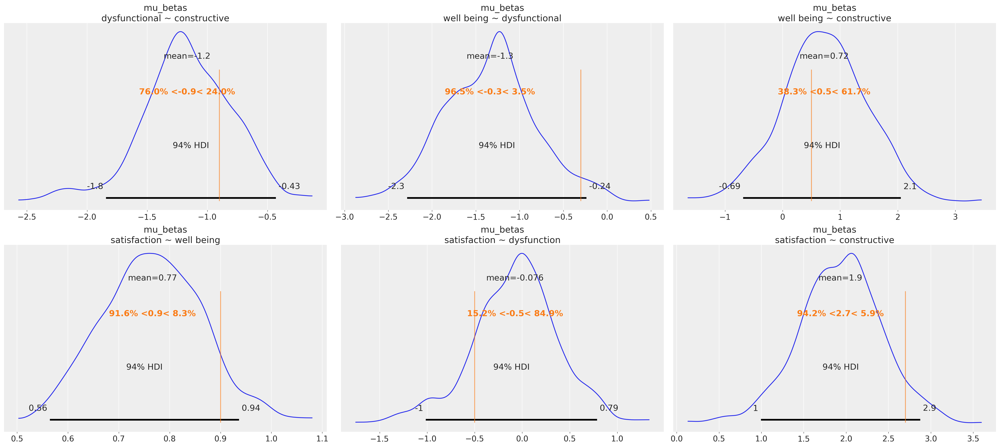

In [377]:
az.plot_posterior(idata, var_names=['mu_betas'], ref_val=[-.9, -.3, .5, .9, -.5, 2.7]);

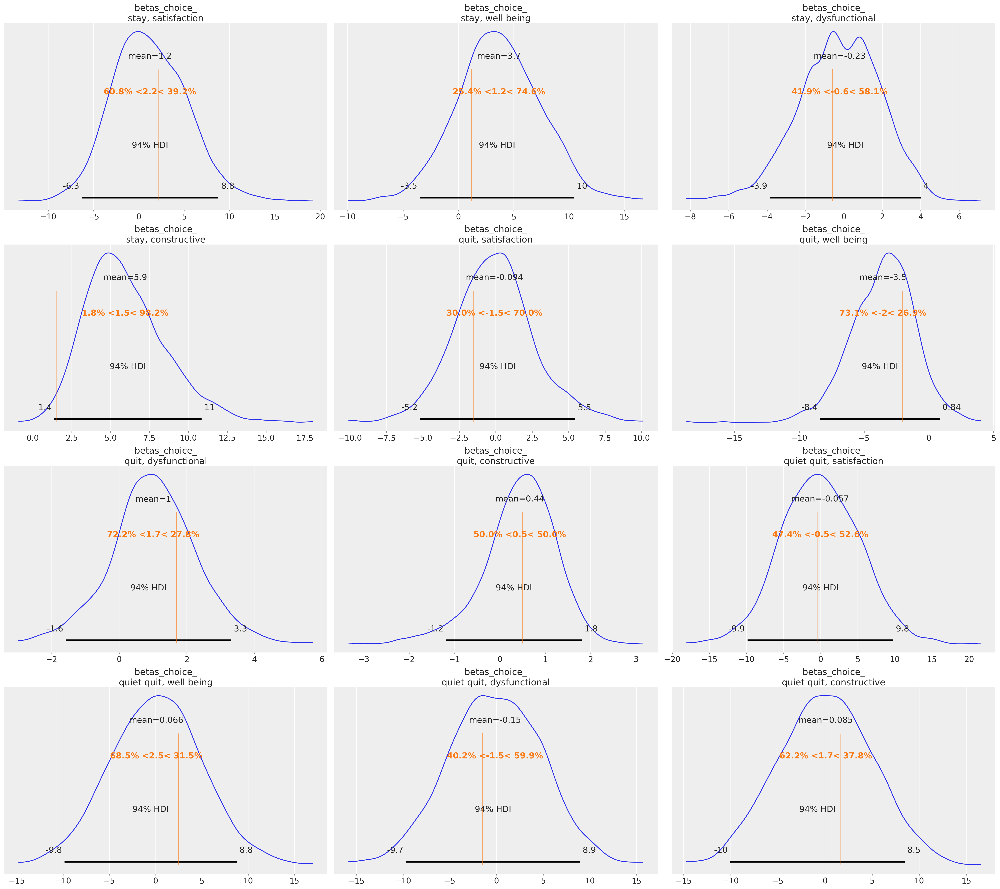

In [378]:
az.plot_posterior(idata, var_names=['betas_choice_'], ref_val=[2.2, 1.2, -.6, 1.5, -1.5, -2, 1.7, 0.5, -.5, 2.5, -1.5, 1.7]);

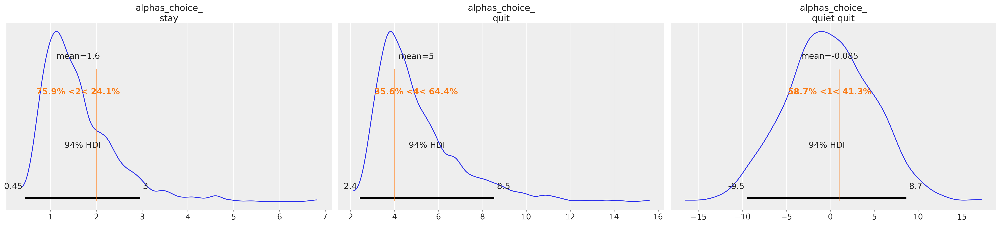

In [379]:
az.plot_posterior(idata, var_names=['alphas_choice_'], ref_val=[2, 4, 1]);

## Authors
- Authored by [Nathaniel Forde](https://nathanielf.github.io/) in November 2025 

## References
:::{bibliography}
:filter: docname in docnames
:::

## Watermark

In [29]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pytensor

Last updated: Sat Sep 27 2025

Python implementation: CPython
Python version       : 3.10.15
IPython version      : 8.32.0

pytensor: 2.25.5

pandas    : 2.3.2
matplotlib: 3.9.2
numpy     : 1.26.4
pymc      : 5.17.0
arviz     : 0.20.0
seaborn   : 0.13.2
pytensor  : 2.25.5

Watermark: 2.5.0



:::{include} ../page_footer.md
:::